In [ ]:
"""""""""

Final project for 5242 : Exploration on GAN

By: 
Chengming Xie
Jiarui Yang
Xinyi Wang

""""""""""


In [1]:
import os

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import scipy.io as spio
from PIL import Image
from zipfile import ZipFile
import time

import tensorflow as tf

import math

In [2]:
def load_mnist(activation = "tanh", BATCH_SIZE = 64):
    BUFFER_SIZE = 10000
    (train_images, train_labels), (_, _) = tf.keras.datasets.mnist.load_data()

    train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')

    if activation == "tanh":
        train_x = (train_images - 127.5)/127.5 
    else: 
        train_x = train_images/255.0

    print("training data shape", train_x.shape)

    train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
        
    return train_dataset, train_x

In [ ]:
def load_training_data(mat_file = "train_32x32.mat",activation = "tanh", BATCH_SIZE = 64,
                      test_plot = True):
    BUFFER_SIZE = 10000
    train = spio.loadmat("train_32x32.mat")
    train_x,train_y = train['X'],train['y']
    train_x = np.moveaxis(train_x,3,0).astype('float32')

    if activation == "tanh":
        train_x = (train_x - 127.5)/127.5 
    else: 
        train_x = train_x/255.0

    print("training data shape", train_x.shape)

    train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
        
    return train_dataset, train_x

In [ ]:
def load_celeb_data(file_name = "100k.zip",BATCH_SIZE = 64,
                    sample_num = 10000, gen_plot = True):
  BUFFER_SIZE = 10000

  with ZipFile(file_name, 'r') as zip_:
    zip_.extractall()

  output_images = []
  path_celeb = "/content/100k/"
  for path in os.listdir(path_celeb):
      if '.jpg' in path:
          output_images.append(os.path.join(path_celeb, path))
  
  data=output_images[0:sample_num]

  images = [np.array((Image.open(path)).resize((64,64))) for path in data]

  for i in range(len(images)):
      images[i] = images[i]/255
  
  train_x = np.array(images).reshape(-1,64,64,3)
  print("training data shape is ", train_x.shape)
  
  if gen_plot:
    print("5 real images in the dataset")
    for i in range(5):
      plt.subplot(1,5,i+1)
      plt.xticks([])
      plt.yticks([])
      plt.imshow(train_x[i], cmap = plt.cm.binary)
    plt.show()

  train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)


        
  return train_dataset, train_x
  

In [3]:
def make_discriminator_model(layer_config,size = (64,32,32,3),
                            activation = "sigmoid",add_dropout = False):
    input_shape = list(size[1:])
    model = tf.keras.Sequential()

    for num_layer,layer in enumerate(layer_config):
        Units,Kernel,Strides,Padding,Batch_norm,Activation= list(layer_config[layer].values())
        if num_layer == 0:
            model.add(tf.keras.layers.Conv2D(Units, Kernel, strides=Strides, padding=Padding,
                              input_shape=input_shape))
        else:
            model.add(tf.keras.layers.Conv2D(Units, Kernel, strides=Strides, padding=Padding)) 
      
        if Batch_norm: 
            model.add(tf.keras.layers.BatchNormalization())
        model.add(Activation)

    model.add(tf.keras.layers.Flatten())
    if add_dropout:
      model.add(tf.keras.layers.Dropout(0.2))
    model.add(tf.keras.layers.Dense(1,activation = activation))
    model.summary()
    
    return model

In [4]:
def make_generator_model(layer_config,size = (64,32,32,3),test = True,dataset = "MNIST"):
    if dataset == "SVNH":
      input_dim = size[1]//8
    elif dataset == "MNIST":
      input_dim = size[1]//4
    elif dataset == "celeb":
      input_dim = size[1]//16

    model = tf.keras.models.Sequential()
    for layer in layer_config:
        if layer == 'Dense':
            Units,input_shape,use_bias,Batch_norm,Activation,last_layer= list(layer_config[layer].values())
            model.add(tf.keras.layers.Dense(input_dim*input_dim*Units, 
                                            input_shape=input_shape,use_bias=use_bias))
            
            model.add(tf.keras.layers.Reshape((input_dim,input_dim,Units)))
        
        else:
            Units,Kernel,Strides,Padding,use_bias,Batch_norm,Activation,last_layer= list(layer_config[layer].values())
            if last_layer:
            
                model.add(tf.keras.layers.Conv2DTranspose(Units, Kernel, strides=Strides, padding=Padding,
                                                          use_bias=use_bias,activation = Activation))
            else:
                model.add(tf.keras.layers.Conv2DTranspose(Units, Kernel, strides=Strides, padding=Padding,use_bias=use_bias))
        if not last_layer:
            if Batch_norm: model.add(tf.keras.layers.BatchNormalization())
            model.add(Activation)

        # if layer == "Dense":
        #   model.add(tf.keras.layers.Reshape((input_dim,input_dim,Units)))
  
    model.summary()
        
    return model


In [5]:
def wasserstein_loss(y_label, y_pred):
    return -tf.keras.backend.mean(y_label * y_pred)

In [6]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [7]:
def discriminator_loss(real_output, fake_output):
    
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    
    return total_loss

In [ ]:
def WGAN_discriminator_loss(real_output, fake_output):
    
    real_loss = wasserstein_loss(tf.ones_like(real_output), real_output)
    fake_loss = wasserstein_loss(tf.ones_like(fake_output)*(-1), fake_output)
    
    return (real_loss,fake_loss)

In [8]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [9]:
def optimizer(opt = "Adam",learning_rate = 1e-4):
    if opt == "Adam":
        generator_optimizer = tf.keras.optimizers.Adam(learning_rate)
        discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate)
    elif opt == "RMSProp":
        generator_optimizer = tf.keras.optimizers.RMSprop(learning_rate)
        discriminator_optimizer = tf.keras.optimizers.RMSprop(learning_rate)
        
    return generator_optimizer,discriminator_optimizer

In [ ]:
@tf.function
def train_step(images,BATCH_SIZE = 64,noise_dim = 100):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [ ]:
@tf.function
def WGAN_train_step(images, n_critic, clip_value,BATCH_SIZE = 64,noise_dim = 100):
    
    ## Train Discriminator multiple times before training Generator
    for n_iter in range(n_critic): 
            
        noise = tf.random.normal([BATCH_SIZE, noise_dim])
        
        for l in range(2):
            with tf.GradientTape() as disc_tape,tf.GradientTape() as gen_tape:

                generated_images = generator(noise, training=True)
             
                real_output = discriminator(images, training=True)
                fake_output = discriminator(generated_images, training=True)
                 
                loss = WGAN_discriminator_loss(real_output, fake_output)
                
                # train the discriminator network
                # real data label=1, fake data label=-1
                # instead of 1 combined batch of real and fake images,
                # train with 1 batch of real data first, then 1 batch
                # of fake images.

                cur_loss = loss[l]    
                gen_loss = generator_loss(fake_output)

            gradients_of_discriminator = disc_tape.gradient(cur_loss, discriminator.trainable_variables)

            ## Apply gradient clipping to satisfy Lipschitz constraint
            gradients_of_discriminator = [tf.clip_by_value(gradient, 
                              clip_value_min=-clip_value, 
                              clip_value_max=clip_value) for gradient in gradients_of_discriminator]
                              
            discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, 
                                                    discriminator.trainable_variables))
             
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
            
    generator_optimizer.apply_gradients(zip(gradients_of_generator,generator.trainable_variables))    
        

In [ ]:
def generate_and_save_images(model, epoch, test_input,activation = "tanh",dataset = "MNIST"):

    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(4,4))
    rows = int(math.sqrt(predictions.shape[0]))

    for i in range(predictions.shape[0]):
        plt.subplot(rows, rows, i + 1)
        if dataset == "MNIST":
          if activation == "tanh":
              plt.imshow((predictions[i, :, :, 0]* 127.5 + 127.5).numpy().astype(np.uint8), cmap='binary')
          elif activation == "sigmoid":
              plt.imshow((predictions[i, :, :, 0]*255).numpy().astype(np.uint8), cmap='binary')
        else:
          if activation == "tanh":
              plt.imshow((predictions[i, :, :, :]* 127.5 + 127.5).numpy().astype(np.uint8), cmap='binary')
          elif activation == "sigmoid":
              plt.imshow((predictions[i, :, :, :]*255).numpy().astype(np.uint8), cmap='binary')
            
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

In [ ]:
def train(dataset, epochs = 50 ,noise_dim = 100, num_examples_to_generate = 16,GAN_type = "Regular",
          n_critic = 5,clip_value = 0.01,image_dataset = "MNIST",activation = "tanh"):
    
    seed = tf.random.normal([num_examples_to_generate, noise_dim])
    start = time.time()

    for epoch in range(epochs):
        
        for image_batch in dataset:
            if GAN_type == "Regular":
               train_step(image_batch)
            elif GAN_type == "WGAN":
               WGAN_train_step(image_batch, n_critic = n_critic, clip_value = clip_value)

        if epoch % 5 == 0:
           generate_and_save_images(generator,
                             epoch + 1,
                             seed,
                             dataset = image_dataset,
                             activation = activation
                             )
           print ('Time for epoch {} is {} sec'.format(epoch, time.time()-start))

### GAN on SVNH dataset (Sigmoid activation on Generator's last layer, worse than Tanh)

training data shape (73257, 32, 32, 3)
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_12 (LeakyReLU)   (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
batch_normalization_5 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_13 (LeakyReLU)   (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 4, 4, 256)         819456    
_________________________________________________________________
batch_normaliza

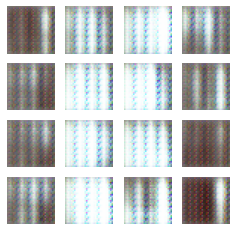

Time for epoch 0 is 24.50974130630493 sec


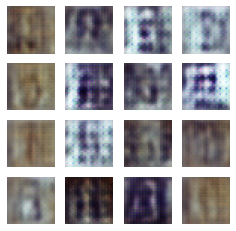

Time for epoch 5 is 133.5604977607727 sec


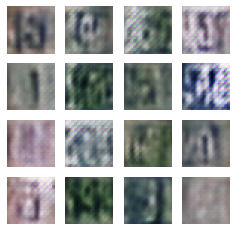

Time for epoch 10 is 242.59518098831177 sec


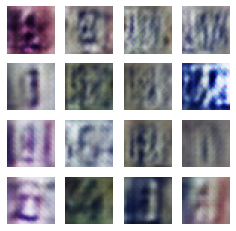

Time for epoch 15 is 351.7689278125763 sec


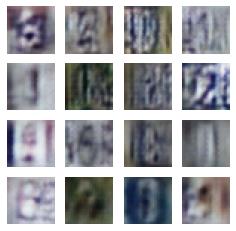

Time for epoch 20 is 460.79391169548035 sec


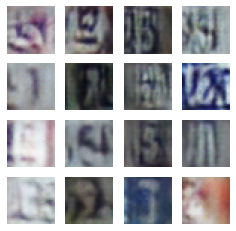

Time for epoch 25 is 569.8202042579651 sec


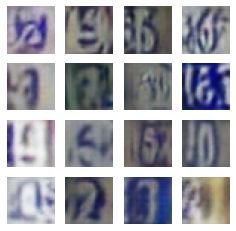

Time for epoch 30 is 678.9619159698486 sec


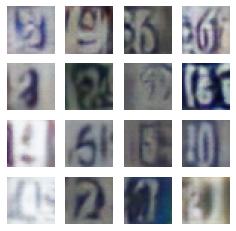

Time for epoch 35 is 787.965784072876 sec


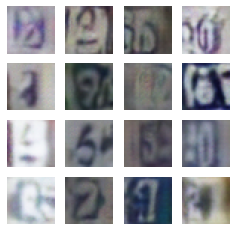

Time for epoch 40 is 897.1072475910187 sec


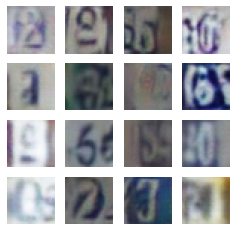

Time for epoch 45 is 1006.0312025547028 sec


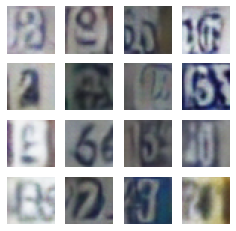

Time for epoch 50 is 1115.0720698833466 sec


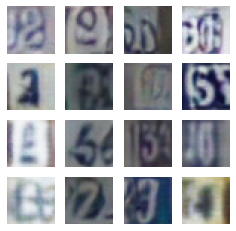

Time for epoch 55 is 1224.242957830429 sec


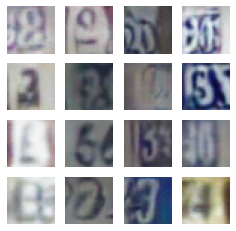

Time for epoch 60 is 1333.2583804130554 sec


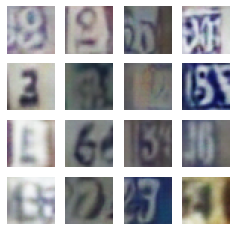

Time for epoch 65 is 1442.2805597782135 sec


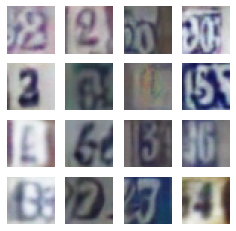

Time for epoch 70 is 1551.4423913955688 sec


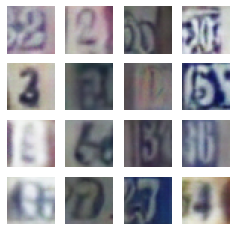

Time for epoch 75 is 1660.4815833568573 sec


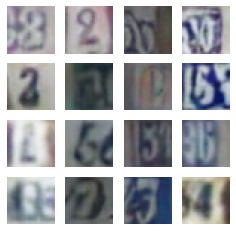

Time for epoch 80 is 1769.4880347251892 sec


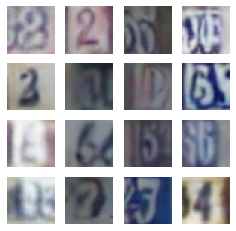

Time for epoch 85 is 1878.6809866428375 sec


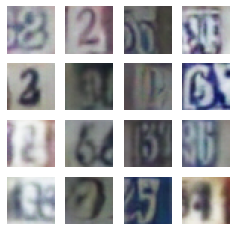

Time for epoch 90 is 1987.7235243320465 sec


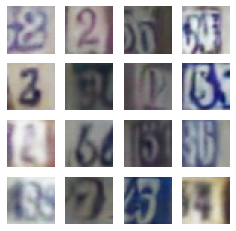

Time for epoch 95 is 2096.7524251937866 sec


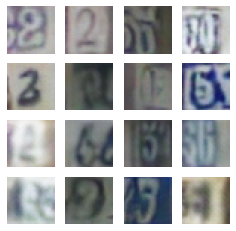

Time for epoch 100 is 2205.919884443283 sec


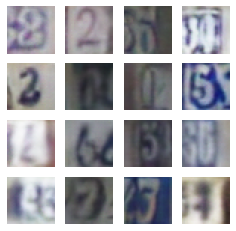

Time for epoch 105 is 2314.9431529045105 sec


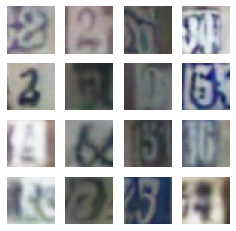

Time for epoch 110 is 2423.9495816230774 sec


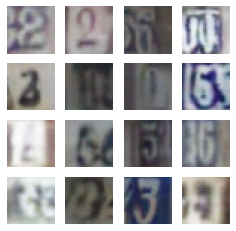

Time for epoch 115 is 2533.117336034775 sec


In [ ]:
"""""""""

GAN on SVNH dataset
Adam Optimizer with 1e-4 learning rate 
Sigmoid activation on generator's last Transpose Conv2D layer
Architectures as two config dictionary
Train for 120 epochs

"""""""""

Generator_config = {
    "Dense":{"Units":512,"input_shape": (100,),"use_bias":False,
             "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_1":{"Units": 256,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_2":{"Units": 128,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_3":{"Units": 3,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias": False,
                   "Batch_norm":False,"Activation":"sigmoid","last_layer":True}
}

train_dataset,train_x = load_training_data(activation = "sigmoid")

discriminator = make_discriminator_model(layer_config = Discriminator_config,activation = "sigmoid")
generator = make_generator_model(layer_config = Generator_config, dataset = "SVNH")
generator_optimizer,discriminator_optimizer = optimizer("Adam")

train(train_dataset,epochs = 120,GAN_type = "Regular",image_dataset = "SVNH",activation = "sigmoid")

### GAN on SVNH dataset (Tanh activation on Generator's last layer)

training data shape (73257, 32, 32, 3)
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
batch_normalization (BatchNo (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 4, 4, 256)         819456    
_________________________________________________________________
batch_normalizati

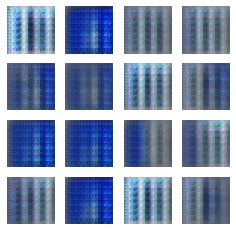

Time for epoch 0 is 26.2413649559021 sec


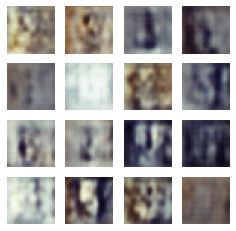

Time for epoch 5 is 135.8301227092743 sec


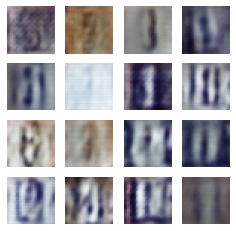

Time for epoch 10 is 245.1153256893158 sec


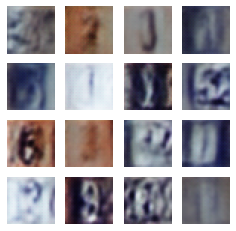

Time for epoch 15 is 354.38807916641235 sec


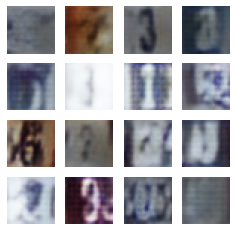

Time for epoch 20 is 463.8230164051056 sec


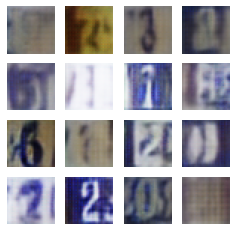

Time for epoch 25 is 573.0831859111786 sec


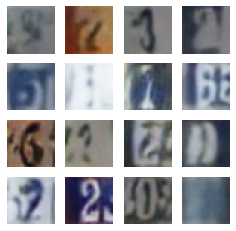

Time for epoch 30 is 682.4027009010315 sec


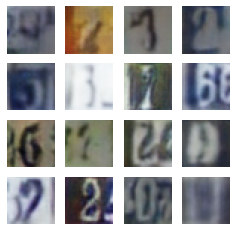

Time for epoch 35 is 791.8056902885437 sec


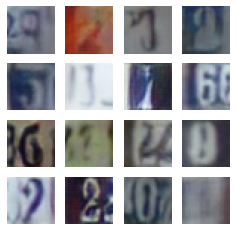

Time for epoch 40 is 901.0587015151978 sec


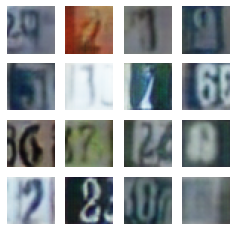

Time for epoch 45 is 1010.3610157966614 sec


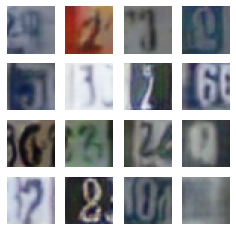

Time for epoch 50 is 1119.7957785129547 sec


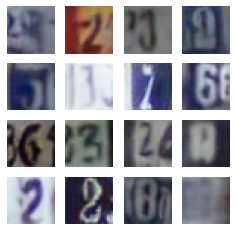

Time for epoch 55 is 1229.104262828827 sec


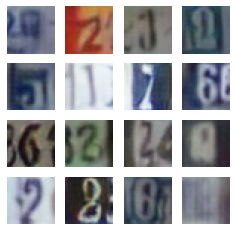

Time for epoch 60 is 1338.393720626831 sec


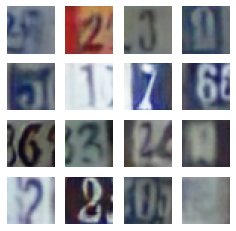

Time for epoch 65 is 1447.8509747982025 sec


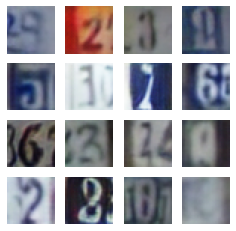

Time for epoch 70 is 1557.1250584125519 sec


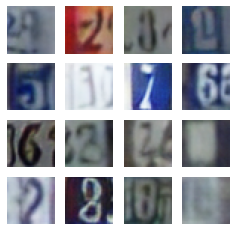

Time for epoch 75 is 1666.414666891098 sec


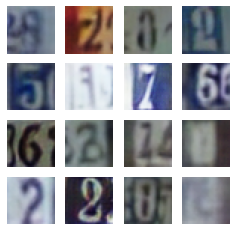

Time for epoch 80 is 1775.8781249523163 sec


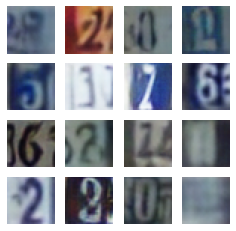

Time for epoch 85 is 1885.1747574806213 sec


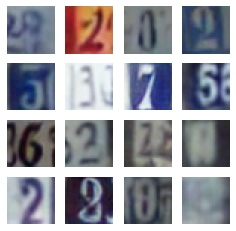

Time for epoch 90 is 1994.445820093155 sec


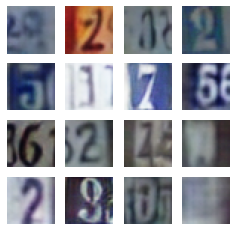

Time for epoch 95 is 2103.8681786060333 sec


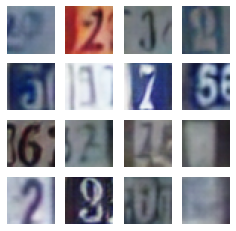

Time for epoch 100 is 2213.1362516880035 sec


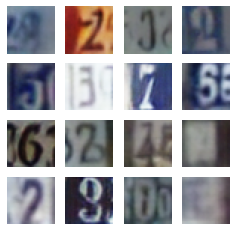

Time for epoch 105 is 2322.419891834259 sec


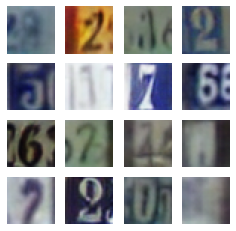

Time for epoch 110 is 2431.861670732498 sec


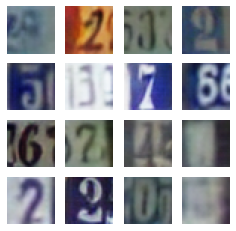

Time for epoch 115 is 2541.1522200107574 sec


In [ ]:
"""""""""

GAN on SVNH dataset
Adam Optimizer with 1e-4 learning rate 
tanh activation on generator's last Transpose Conv2D layer
Architectures as two config dictionary
Train for 120 epochs

"""""""""

Discriminator_config = {
    "CNN_1":{"Units": 64,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":False,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)},
    "CNN_2":{"Units": 128,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)},
    "CNN_3":{"Units": 256,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)}
}

Generator_config = {
    "Dense":{"Units":512,"input_shape": (100,),"use_bias":False,
             "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_1":{"Units": 256,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_2":{"Units": 128,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_3":{"Units": 3,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias": False,
                   "Batch_norm":False,"Activation":"tanh","last_layer":True}
}

train_dataset,train_x = load_training_data()

discriminator = make_discriminator_model(layer_config = Discriminator_config,activation = "sigmoid")
generator = make_generator_model(layer_config = Generator_config, dataset = "SVNH")
generator_optimizer,discriminator_optimizer = optimizer("Adam")

train(train_dataset,epochs = 120,GAN_type = "Regular",image_dataset = "SVNH")

### WGAN on SVNH dataset (Tanh activation on Generator's last layer)

training data shape (73257, 32, 32, 3)
Model: "sequential_36"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_64 (Conv2D)           (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_176 (LeakyReLU)  (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_65 (Conv2D)           (None, 8, 8, 128)         204928    
_________________________________________________________________
batch_normalization_85 (Batc (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_177 (LeakyReLU)  (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_66 (Conv2D)           (None, 4, 4, 256)         819456    
_________________________________________________________________
batch_normaliz

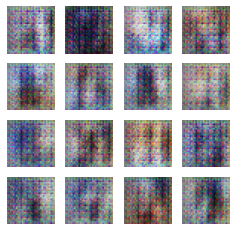

Time for epoch 0 is 126.81191229820251 sec


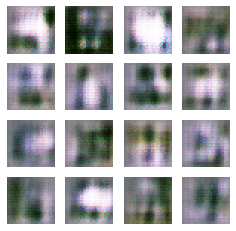

Time for epoch 5 is 677.4151194095612 sec


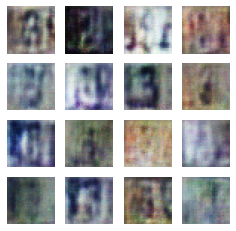

Time for epoch 10 is 1228.2120637893677 sec


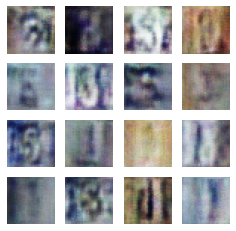

Time for epoch 15 is 1778.7743401527405 sec


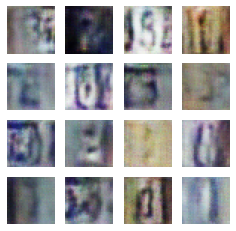

Time for epoch 20 is 2329.2324073314667 sec


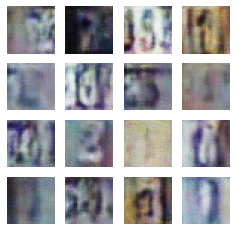

Time for epoch 25 is 2879.942839860916 sec


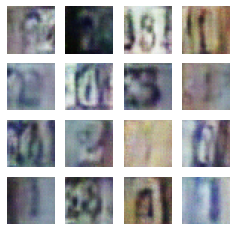

Time for epoch 30 is 3430.6335985660553 sec


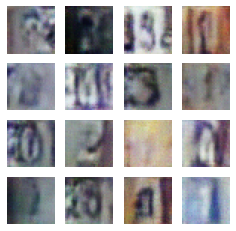

Time for epoch 35 is 3981.461432695389 sec


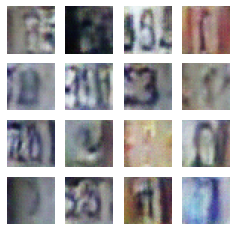

Time for epoch 40 is 4532.141057014465 sec


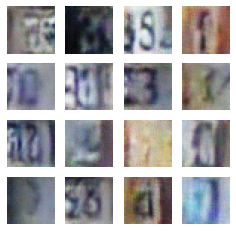

Time for epoch 45 is 5082.906264543533 sec


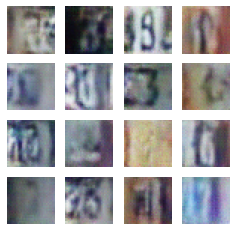

Time for epoch 50 is 5633.595089197159 sec


In [ ]:
Discriminator_config = {
    "CNN_1":{"Units": 64,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":False,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)},
    "CNN_2":{"Units": 128,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)},
    "CNN_3":{"Units": 256,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)}
}

Generator_config = {
    "Dense":{"Units":512,"input_shape": (100,),"use_bias":False,
             "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_1":{"Units": 256,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_2":{"Units": 128,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_3":{"Units": 3,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias": False,
                   "Batch_norm":False,"Activation":"tanh","last_layer":True}
}

train_dataset,train_x = load_training_data()
## Linear Activation in the final layer of discriminator which then followed by Wassertein loss function
discriminator = make_discriminator_model(layer_config = Discriminator_config,activation="linear")
generator = make_generator_model(layer_config = Generator_config ,dataset = "SVNH")

## RMSProp with smaller learning rate
generator_optimizer,discriminator_optimizer = optimizer("RMSProp",learning_rate = 5e-5)
train(train_dataset,GAN_type = "WGAN",epochs = 120,image_dataset = "SVNH")

### GAN on MNIST dataset

11493376/11490434 [==============================] - 0s 0us/step
training data shape (60000, 28, 28, 1)
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 14, 14, 64)        1664      
_________________________________________________________________
leaky_re_lu_20 (LeakyReLU)   (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 7, 7, 128)         204928    
_________________________________________________________________
batch_normalization_10 (Batc (None, 7, 7, 128)         512       
_________________________________________________________________
leaky_re_lu_21 (LeakyReLU)   (None, 7, 7, 128)         0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 6272)              0         
________________

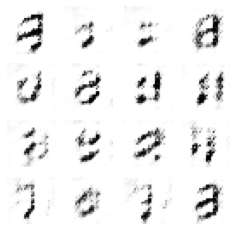

Time for epoch 0 is 9.674693822860718 sec


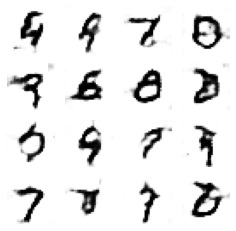

Time for epoch 5 is 45.78199648857117 sec


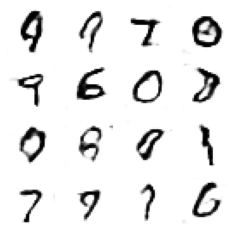

Time for epoch 10 is 81.81949734687805 sec


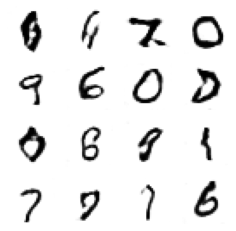

Time for epoch 15 is 117.84295916557312 sec


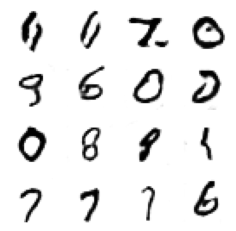

Time for epoch 20 is 154.0394585132599 sec


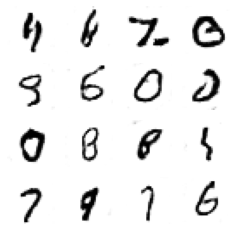

Time for epoch 25 is 190.0685555934906 sec


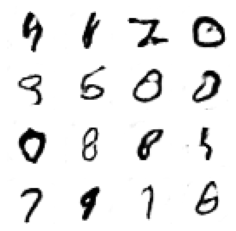

Time for epoch 30 is 226.09036922454834 sec


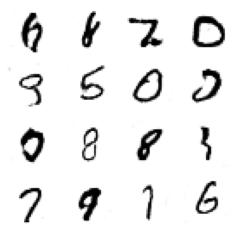

Time for epoch 35 is 262.236704826355 sec


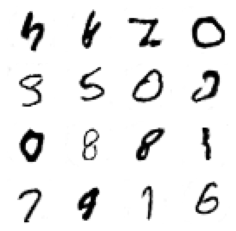

Time for epoch 40 is 298.2668640613556 sec


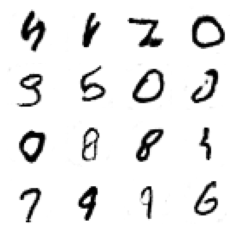

Time for epoch 45 is 334.25090622901917 sec


In [ ]:
Discriminator_config = {
    "CNN_1":{"Units": 64,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":False,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)},
    "CNN_2":{"Units": 128,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)}
}

Generator_config = {
    "Dense":{"Units":256,"input_shape": (100,),"use_bias":False,
             "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_1":{"Units": 128,"Kernel":(5,5),"Strides":(1,1),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_2":{"Units": 64,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_3":{"Units": 1,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias": False,
                   "Batch_norm":False,"Activation":"tanh","last_layer":True}
}

train_dataset,train_x = load_mnist()

discriminator = make_discriminator_model(layer_config = Discriminator_config,size = (64,28,28,1))
generator = make_generator_model(layer_config = Generator_config,size = (64,28,28,1),dataset = "MNIST")
generator_optimizer,discriminator_optimizer = optimizer("Adam")

train(train_dataset,epochs = 50,dataset = "MNIST")

### WGAN on MNIST

training data shape (60000, 28, 28, 1)
Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 14, 14, 32)        832       
_________________________________________________________________
leaky_re_lu_52 (LeakyReLU)   (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 7, 7, 64)          51264     
_________________________________________________________________
batch_normalization_23 (Batc (None, 7, 7, 64)          256       
_________________________________________________________________
leaky_re_lu_53 (LeakyReLU)   (None, 7, 7, 64)          0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 4, 4, 128)         204928    
_________________________________________________________________
batch_normaliz

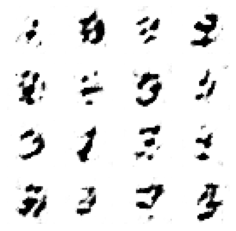

Time for epoch 0 is 68.2631607055664 sec


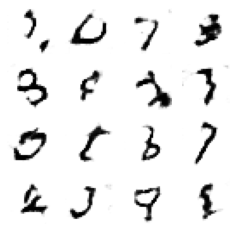

Time for epoch 5 is 325.83391070365906 sec


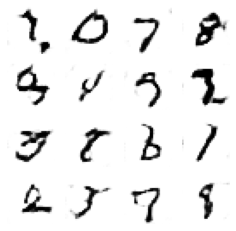

Time for epoch 10 is 583.4614136219025 sec


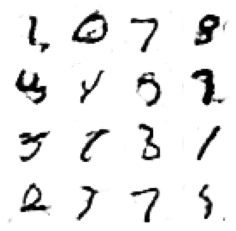

Time for epoch 15 is 841.4348459243774 sec


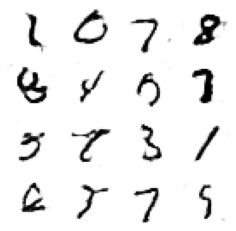

Time for epoch 20 is 1099.4572031497955 sec


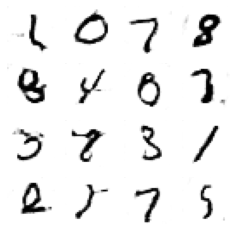

Time for epoch 25 is 1357.2146186828613 sec


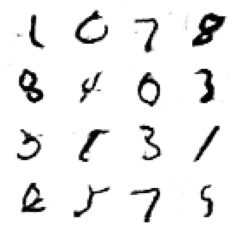

Time for epoch 30 is 1614.990149974823 sec


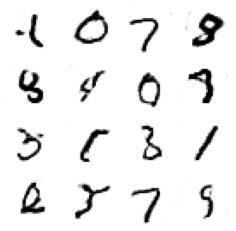

Time for epoch 35 is 1872.7055423259735 sec


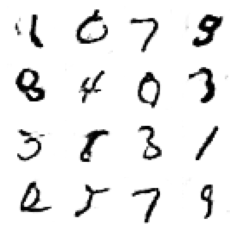

Time for epoch 40 is 2130.7616844177246 sec


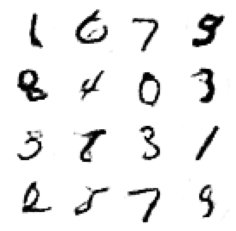

Time for epoch 45 is 2388.3034207820892 sec


In [ ]:
Discriminator_config = {
    "CNN_1":{"Units": 32,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":False,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)},
    "CNN_2":{"Units": 64,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)},
    "CNN_3":{"Units": 128,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)}              
}

Generator_config = {
    "Dense":{"Units":128,"input_shape": (100,),"use_bias":False,
             "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_1":{"Units": 128,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_2":{"Units": 64,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_3":{"Units": 1,"Kernel":(5,5),"Strides":(1,1),"Padding":"same","use_bias": False,
                   "Batch_norm":False,"Activation":"tanh","last_layer":True}
}

train_dataset,train_x = load_mnist()

discriminator = make_discriminator_model(layer_config = Discriminator_config,size = (64,28,28,1),activation="linear")
generator = make_generator_model(layer_config = Generator_config,size = (64,28,28,1),dataset = "MNIST")
generator_optimizer,discriminator_optimizer = optimizer("RMSProp",learning_rate = 5e-5)

train(train_dataset,epochs = 50,GAN_type = "WGAN",image_dataset = "MNIST")

### GAN on Face data

training data shape is  (10000, 64, 64, 3)
5 real images in the dataset


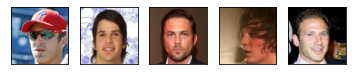

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_35 (Conv2D)           (None, 32, 32, 32)        2432      
_________________________________________________________________
leaky_re_lu_111 (LeakyReLU)  (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 16, 16, 64)        51264     
_________________________________________________________________
batch_normalization_44 (Batc (None, 16, 16, 64)        256       
_________________________________________________________________
leaky_re_lu_112 (LeakyReLU)  (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 8, 8, 128)         204928    
_________________________________________________________________
batch_normalization_45 (Batc (None, 8, 8, 128)       

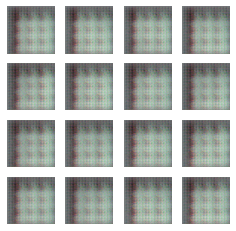

Time for epoch 0 is 8.750441312789917 sec


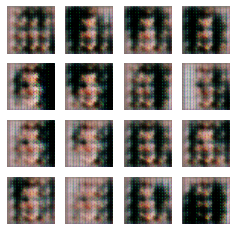

Time for epoch 5 is 35.69864749908447 sec


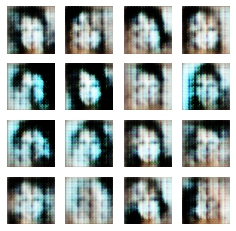

Time for epoch 10 is 62.64767265319824 sec


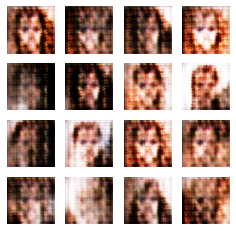

Time for epoch 15 is 89.82585000991821 sec


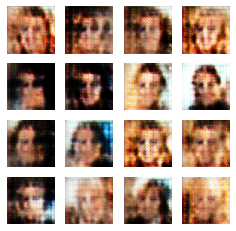

Time for epoch 20 is 116.78434991836548 sec


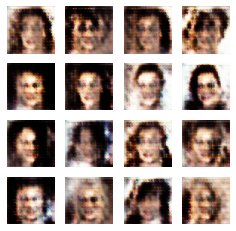

Time for epoch 25 is 143.7378273010254 sec


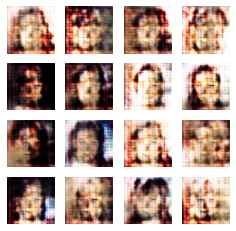

Time for epoch 30 is 170.66541862487793 sec


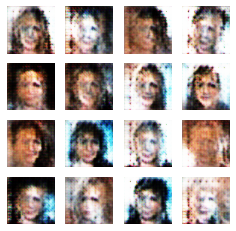

Time for epoch 35 is 197.5900375843048 sec


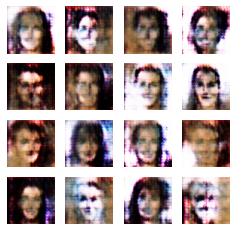

Time for epoch 40 is 224.76785469055176 sec


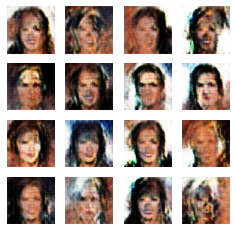

Time for epoch 45 is 251.6956911087036 sec


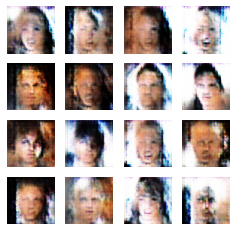

Time for epoch 50 is 278.50433373451233 sec


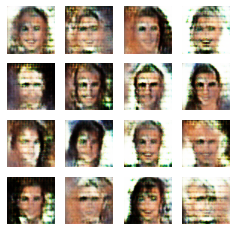

Time for epoch 55 is 305.26863956451416 sec


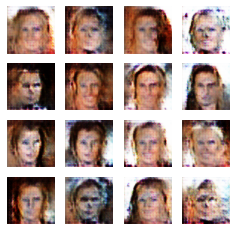

Time for epoch 60 is 332.27559304237366 sec


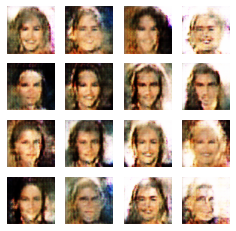

Time for epoch 65 is 359.1018009185791 sec


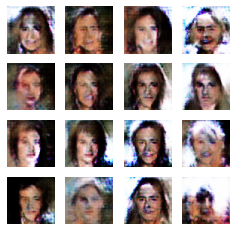

Time for epoch 70 is 386.0321078300476 sec


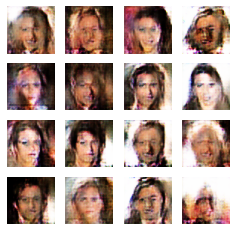

Time for epoch 75 is 412.93221521377563 sec


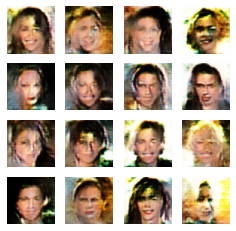

Time for epoch 80 is 439.8767104148865 sec


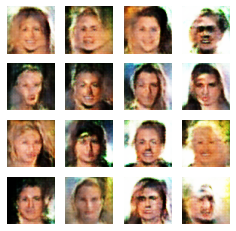

Time for epoch 85 is 467.0319981575012 sec


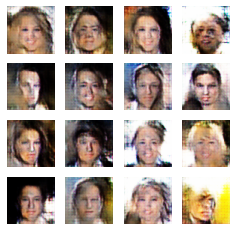

Time for epoch 90 is 493.99606347084045 sec


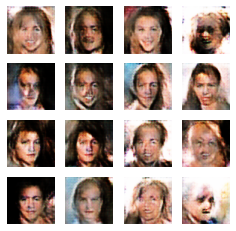

Time for epoch 95 is 520.8957991600037 sec


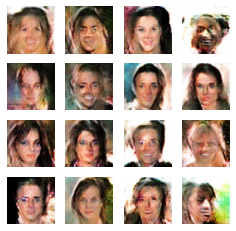

Time for epoch 100 is 547.8264031410217 sec


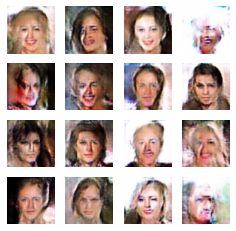

Time for epoch 105 is 575.0366084575653 sec


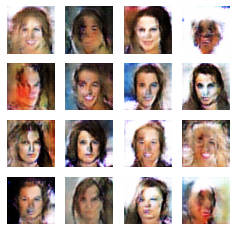

Time for epoch 110 is 601.9921736717224 sec


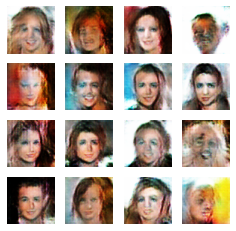

Time for epoch 115 is 628.9426934719086 sec


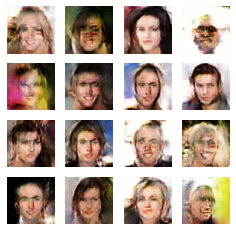

Time for epoch 120 is 655.8996784687042 sec


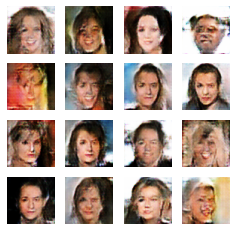

Time for epoch 125 is 682.8523542881012 sec


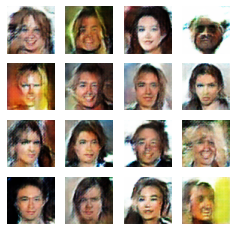

Time for epoch 130 is 710.0699155330658 sec


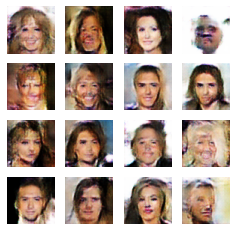

Time for epoch 135 is 737.0121128559113 sec


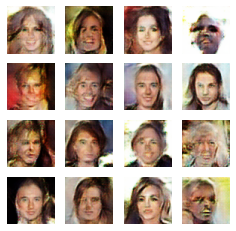

Time for epoch 140 is 763.9644401073456 sec


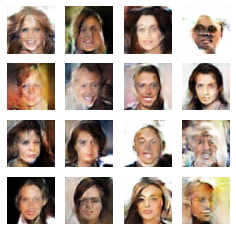

Time for epoch 145 is 790.8877384662628 sec


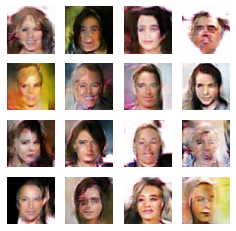

Time for epoch 150 is 818.0627119541168 sec


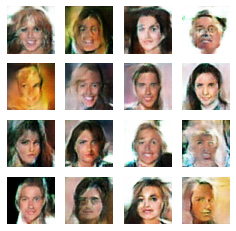

Time for epoch 155 is 845.0173585414886 sec


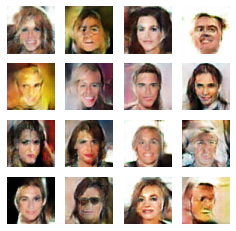

Time for epoch 160 is 871.964677810669 sec


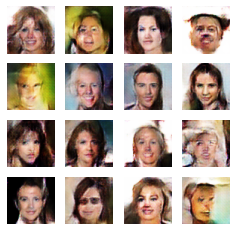

Time for epoch 165 is 898.93292927742 sec


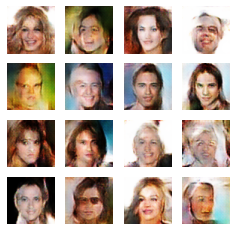

Time for epoch 170 is 925.8798773288727 sec


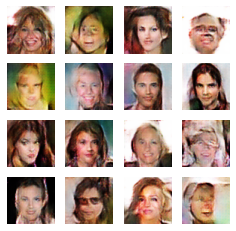

Time for epoch 175 is 953.028571844101 sec


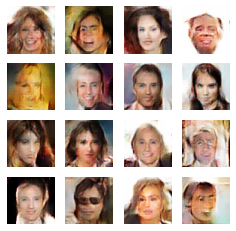

Time for epoch 180 is 979.9460124969482 sec


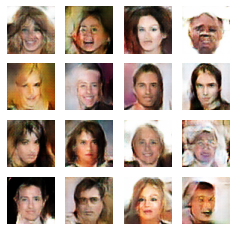

Time for epoch 185 is 1006.8829607963562 sec


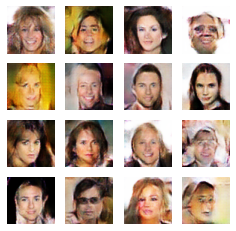

Time for epoch 190 is 1033.8327922821045 sec


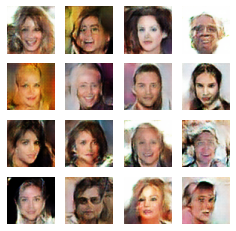

Time for epoch 195 is 1061.0272171497345 sec


In [ ]:
Generator_config = {
    "Dense":{"Units":512,"input_shape": (100,),"use_bias":False,
             "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_1":{"Units": 256,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_2":{"Units": 128,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_3":{"Units": 64,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_4":{"Units": 3,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias": False,
                   "Batch_norm":False,"Activation":"sigmoid","last_layer":True}
}

Discriminator_config = {
    "CNN_1":{"Units": 32,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":False,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)},
    "CNN_2":{"Units": 64,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)},
    "CNN_3":{"Units": 128,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)},
    "CNN_4":{"Units": 256,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)}
}

train_dataset,train_x = load_celeb_data()
## Linear Activation in the final layer of discriminator which then followed by Wassertein loss function
discriminator = make_discriminator_model(layer_config = Discriminator_config,
                                         size = (64,64,64,3),add_dropout = True)
generator = make_generator_model(layer_config = Generator_config, size = (64,64,64,3),dataset="celeb")

## RMSProp with smaller learning rate
generator_optimizer,discriminator_optimizer = optimizer("Adam")

train(train_dataset,epochs = 200,image_dataset = "celeb",activation = "sigmoid")


# Plot of training process using GAN on MNIST

11493376/11490434 [==============================] - 0s 0us/step
training data shape (60000, 28, 28, 1)
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 14, 14, 64)        1664      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 7, 7, 128)         204928    
_________________________________________________________________
batch_normalization (BatchNo (None, 7, 7, 128)         512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 7, 7, 128)         0         
_________________________________________________________________
flatten (Flatten)            (None, 6272)              0         
__________________

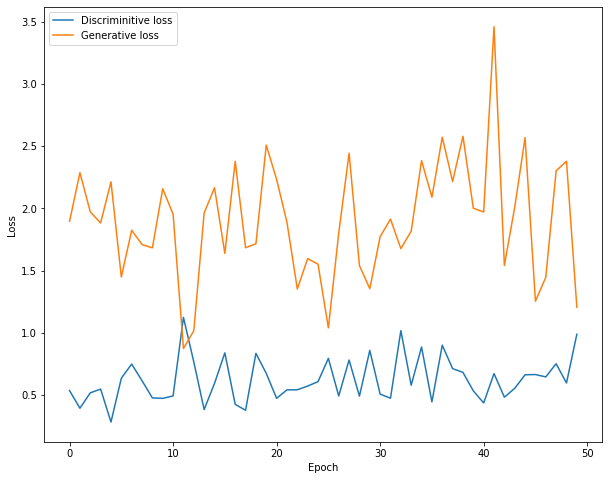

In [10]:
Discriminator_config = {
    "CNN_1":{"Units": 64,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":False,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)},
    "CNN_2":{"Units": 128,"Kernel":(5,5),"Strides":(2,2),"Padding":"same",
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2)}
}

Generator_config = {
    "Dense":{"Units":256,"input_shape": (100,),"use_bias":False,
             "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_1":{"Units": 128,"Kernel":(5,5),"Strides":(1,1),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_2":{"Units": 64,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias":False,
                   "Batch_norm":True,"Activation":tf.keras.layers.LeakyReLU(alpha = 0.2),"last_layer":False},
    "Transpose_3":{"Units": 1,"Kernel":(5,5),"Strides":(2,2),"Padding":"same","use_bias": False,
                   "Batch_norm":False,"Activation":"tanh","last_layer":True}
}


train_dataset,train_x = load_mnist()

discriminator = make_discriminator_model(layer_config = Discriminator_config,size = (64,28,28,1))
generator = make_generator_model(layer_config = Generator_config,size = (64,28,28,1),dataset = "MNIST")
generator_optimizer,discriminator_optimizer = optimizer("Adam")

seed = tf.random.normal([16, 100])
start = time.time()

dloss = []
gloss = []

for epoch in range(50):
    
    for image_batch in train_dataset:

        noise = tf.random.normal([64, 100])

        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            generated_images = generator(noise, training=True)

            real_output = discriminator(image_batch, training=True)
            fake_output = discriminator(generated_images, training=True)

            gen_loss = generator_loss(fake_output)
            disc_loss = discriminator_loss(real_output, fake_output)

        gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
        gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

        generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
        discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    dloss.append(disc_loss)
    gloss.append(gen_loss)

plt.figure(figsize=(10, 8))
plt.plot(dloss, label='Discriminitive loss')
plt.plot(gloss, label='Generative loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()